
## Part II – Vision Task: Image Classification with Convolutional Neural Networks
### Dataset: Pest Image Classification Dataset (Kaggle)




##  Environment Setup & Library Imports


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#  Core Python & Data Science Libraries
import os
import zipfile
import time
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
from pathlib import Path

#  Scikit-Learn: Metrics and Utilities
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay
)

#  TensorFlow / Keras: Deep Learning Framework
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, callbacks, regularizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array

#  Pre-trained Models for Transfer Learning (Part B)
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input as mobilenet_preprocess

#  Global Settings
warnings.filterwarnings('ignore')
np.random.seed(42)
tf.random.set_seed(42)

# Set a clean, consistent plot style
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette('Set2')

In [ ]:
print(f"TensorFlow version : {tf.__version__}")
print(f"Keras version      : {keras.__version__}")

# Check if GPU is available — training is much faster with GPU/TPU on Colab
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    print(f"GPU Available      : {gpus[0].name}")
else:
    print("GPU               : Not detected (running on CPU)")

TensorFlow version : 2.20.0
Keras version      : 3.13.2
GPU Available      : /physical_device:GPU:0


---
## Part A: Designing and Analyzing CNNs from Scratch
---

## Task 1 – Data Understanding, Analysis, Visualization and Cleaning

In [ ]:

ZIP_PATH = "/content/drive/MyDrive/AI Coursework/pest.zip"

# Extract directly to /content/
EXTRACT_DIR = "/content/pest_dataset"
os.makedirs(EXTRACT_DIR, exist_ok=True)

with zipfile.ZipFile(ZIP_PATH, 'r') as zip_ref:
    zip_ref.extractall(EXTRACT_DIR)

print(f"Extracted to: {EXTRACT_DIR}")

Extracted to: /content/pest_dataset


In [ ]:
# Loading train and test datas from their respective folders
TRAIN_DIR_a = "/content/pest_dataset/pest/train"
TEST_DIR_a  = "/content/pest_dataset/pest/test"


In [ ]:
# These are global hyper-parameters used throughout the notebook
IMG_HEIGHT   = 128
IMG_WIDTH    = 128
BATCH_SIZE   = 32
NUM_CLASSES  = 9

# Convert TRAIN_DIR to a Path object for iterdir()
TRAIN_DIR = Path(TRAIN_DIR_a)
TEST_DIR  = Path(TEST_DIR_a)

# Class names in the dataset
CLASS_NAMES = sorted([d.name for d in TRAIN_DIR.iterdir() if d.is_dir()])
print("Classes found:", CLASS_NAMES)
print(f"Total classes : {len(CLASS_NAMES)}")

Classes found: ['aphids', 'armyworm', 'beetle', 'bollworm', 'grasshopper', 'mites', 'mosquito', 'sawfly', 'stem_borer']
Total classes : 9


In [ ]:
#  Count Images Per Class

def count_images(base_dir):
    """
    Walks through each class subfolder and counts images.
    Returns a DataFrame with class names and image counts.
    """
    records = []
    for cls_folder in sorted(base_dir.iterdir()):
        if cls_folder.is_dir():
            count = len(list(cls_folder.glob('*.jpg'))) + \
                    len(list(cls_folder.glob('*.jpeg'))) + \
                    len(list(cls_folder.glob('*.png')))
            records.append({'Class': cls_folder.name, 'Count': count})
    return pd.DataFrame(records)

train_counts = count_images(TRAIN_DIR)
test_counts  = count_images(TEST_DIR)
train_counts['Split'] = 'Train'
test_counts['Split']  = 'Test'

all_counts = pd.concat([train_counts, test_counts], ignore_index=True)

print("=" * 50)
print("TRAINING SET — Image counts per class:")
print("=" * 50)
print(train_counts.to_string(index=False))
print(f"\nTotal Training Images : {train_counts['Count'].sum()}")
print(f"Total Testing Images  : {test_counts['Count'].sum()}")
print(f"Total Images Overall  : {all_counts['Count'].sum()}")

TRAINING SET — Image counts per class:
      Class  Count Split
     aphids    300 Train
   armyworm    300 Train
     beetle    300 Train
   bollworm    300 Train
grasshopper    300 Train
      mites    300 Train
   mosquito    300 Train
     sawfly    300 Train
 stem_borer    300 Train

Total Training Images : 2700
Total Testing Images  : 450
Total Images Overall  : 3150


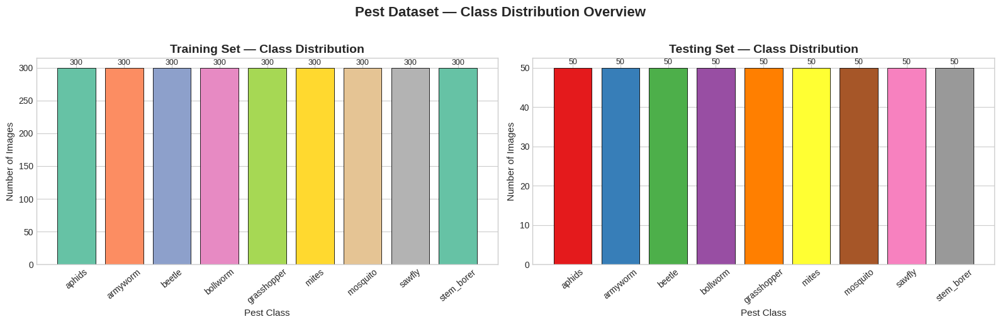

Observation: The dataset is well-balanced (~300 train / ~50 test per class).


In [ ]:
# Visualize Class Distribution

fig, axes = plt.subplots(1, 2, figsize=(16, 5))

# Training distribution
bars = axes[0].bar(train_counts['Class'], train_counts['Count'],
                   color=sns.color_palette('Set2', len(CLASS_NAMES)),
                   edgecolor='black', linewidth=0.6)
axes[0].set_title('Training Set — Class Distribution', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Pest Class', fontsize=11)
axes[0].set_ylabel('Number of Images', fontsize=11)
axes[0].tick_params(axis='x', rotation=40)
# Add value labels on bars
for bar in bars:
    axes[0].text(bar.get_x() + bar.get_width()/2., bar.get_height() + 2,
                 f'{int(bar.get_height())}', ha='center', va='bottom', fontsize=9)

# Testing distribution
bars2 = axes[1].bar(test_counts['Class'], test_counts['Count'],
                    color=sns.color_palette('Set1', len(CLASS_NAMES)),
                    edgecolor='black', linewidth=0.6)
axes[1].set_title('Testing Set — Class Distribution', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Pest Class', fontsize=11)
axes[1].set_ylabel('Number of Images', fontsize=11)
axes[1].tick_params(axis='x', rotation=40)
for bar in bars2:
    axes[1].text(bar.get_x() + bar.get_width()/2., bar.get_height() + 0.5,
                 f'{int(bar.get_height())}', ha='center', va='bottom', fontsize=9)

plt.suptitle('Pest Dataset — Class Distribution Overview', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig('class_distribution.png', dpi=150, bbox_inches='tight')
plt.show()
print("Observation: The dataset is well-balanced (~300 train / ~50 test per class).")

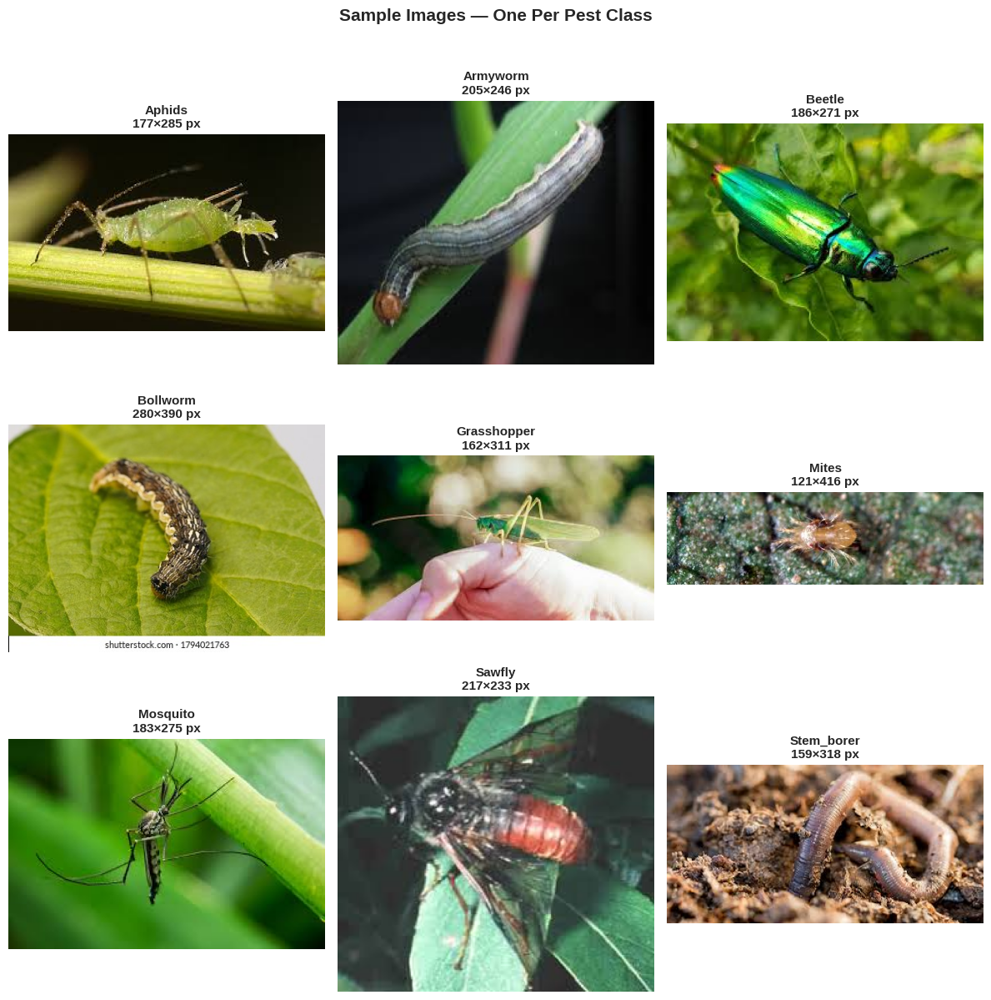

In [ ]:
#  Visualize Sample Images from Each Class

fig, axes = plt.subplots(3, 3, figsize=(12, 12))
axes = axes.flatten()

for idx, cls_name in enumerate(CLASS_NAMES):
    cls_path = TRAIN_DIR / cls_name
    # Pick the first image found in this class folder
    img_files = list(cls_path.glob('*.jpg')) + list(cls_path.glob('*.jpeg')) + list(cls_path.glob('*.png'))
    if img_files:
        img = mpimg.imread(str(img_files[0]))
        axes[idx].imshow(img)
        axes[idx].set_title(f'{cls_name.capitalize()}\n{img.shape[0]}×{img.shape[1]} px',
                            fontsize=11, fontweight='bold')
        axes[idx].axis('off')

plt.suptitle('Sample Images — One Per Pest Class', fontsize=15, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('sample_images.png', dpi=150, bbox_inches='tight')
plt.show()

In [ ]:
# Analyse Raw Image Properties (Size Distribution)

heights, widths = [], []
sample_limit = 30   # Scan first 30 images per class to keep it fast

for cls_name in CLASS_NAMES:
    cls_path = TRAIN_DIR / cls_name
    img_files = (list(cls_path.glob('*.jpg')) +
                 list(cls_path.glob('*.jpeg')) +
                 list(cls_path.glob('*.png')))[:sample_limit]
    for f in img_files:
        try:
            img = load_img(str(f))
            w, h = img.size
            widths.append(w)
            heights.append(h)
        except Exception:
            pass

print(f"Image Width  — Min: {min(widths)}, Max: {max(widths)}, Mean: {np.mean(widths):.0f}")
print(f"Image Height — Min: {min(heights)}, Max: {max(heights)}, Mean: {np.mean(heights):.0f}")
print(f"\nWe will resize all images to {IMG_HEIGHT}×{IMG_WIDTH}px for consistency.")

Image Width  — Min: 183, Max: 2500, Mean: 361
Image Height — Min: 121, Max: 1651, Mean: 250

We will resize all images to 128×128px for consistency.


In [ ]:
# Data Generators — Preprocessing and Augmentation

# Training generator — includes augmentation to improve generalisation
SEED = 42
train_datagen = ImageDataGenerator(
    rescale= 1./255,
    validation_split= 0.2,
    horizontal_flip= True,
    rotation_range= 15,
    zoom_range= 0.1,
)
val_datagen = ImageDataGenerator(
    rescale= 1./255,
    validation_split = 0.2
)

# Test/validation generator
test_datagen = ImageDataGenerator(rescale=1./255)

# Create flow_from_directory generators — they load images in batches from folders
train_generator = train_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size= (IMG_HEIGHT, IMG_WIDTH),
    batch_size= BATCH_SIZE,
    class_mode= 'categorical',   # One-hot encoded labels for multi-class
    subset='training',
    shuffle= True,
    seed= SEED
)

#  VALIDATION GENERATOR
val_generator = train_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation',
    shuffle=False,
    seed = SEED
)

test_generator = test_datagen.flow_from_directory(
    TEST_DIR,
    target_size  = (IMG_HEIGHT, IMG_WIDTH),
    batch_size   = BATCH_SIZE,
    class_mode   = 'categorical',
    shuffle      = False ,           # Keep order fixed for evaluation
    )


# Verify the class index mapping
print("Class → Index Mapping:")
for cls, idx in sorted(train_generator.class_indices.items(), key=lambda x: x[1]):
    print(f"  [{idx}] {cls}")

Found 2160 images belonging to 9 classes.
Found 540 images belonging to 9 classes.
Found 450 images belonging to 9 classes.
Class → Index Mapping:
  [0] aphids
  [1] armyworm
  [2] beetle
  [3] bollworm
  [4] grasshopper
  [5] mites
  [6] mosquito
  [7] sawfly
  [8] stem_borer


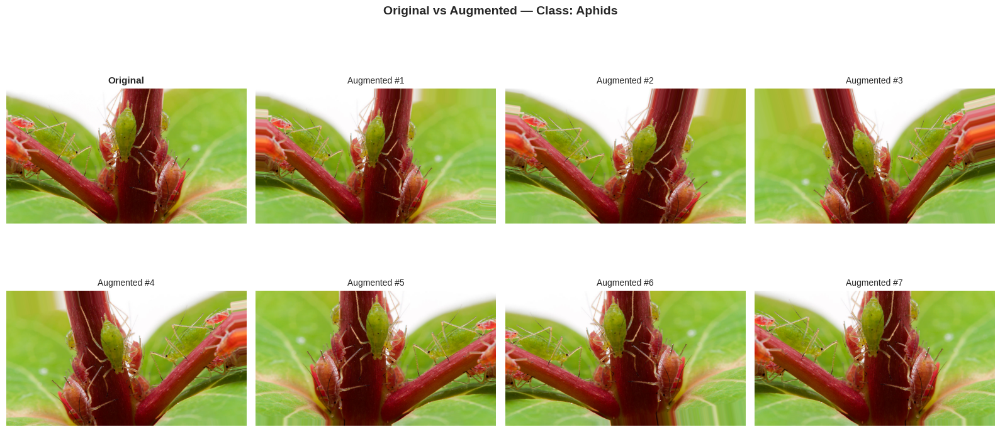

Saved as augmented_samples.png


In [ ]:
from PIL import Image

# Visualize Augmented Images

# Pick one sample image from the first class for demonstration
DEMO_CLASS = CLASS_NAMES[0]
demo_path  = os.path.join(TRAIN_DIR, DEMO_CLASS)
demo_img_path = os.path.join(demo_path, os.listdir(demo_path)[2])

# Load original
original = Image.open(demo_img_path).convert('RGB')
orig_arr = np.array(original) / 255.0

# Augmentation-only generator (no rescale — for display purposes)
aug_gen = ImageDataGenerator(
    horizontal_flip    = True,
    rotation_range      = 15,
    zoom_range          = 0.1,
)

img_array = np.expand_dims(np.array(original), 0)  # shape (1,150,150,3)
aug_iter  = aug_gen.flow(img_array, batch_size=1)

fig, axes = plt.subplots(2, 4, figsize=(16, 8))

# Original in first slot
axes[0][0].imshow(orig_arr)
axes[0][0].set_title('Original', fontsize=11, fontweight='bold')
axes[0][0].axis('off')

# 7 augmented versions
all_axes = list(axes[0][1:]) + list(axes[1])
for i, ax in enumerate(all_axes):
    aug_img = next(aug_iter)[0].astype('uint8')
    ax.imshow(aug_img)
    ax.set_title(f'Augmented #{i+1}', fontsize=10)
    ax.axis('off')

plt.suptitle(f'Original vs Augmented — Class: {DEMO_CLASS.capitalize()}',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('augmented_samples.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved as augmented_samples.png')

In [ ]:
#Utility Functions
# Plot Training vs Validation Curves

def plot_training_curves(history, title='Model', color='steelblue'):
    """
    Plots training and validation loss and accuracy curves side by side.
    """
    hist = history.history
    epochs_ran = range(1, len(hist['loss']) + 1)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

    # Loss curve
    ax1.plot(epochs_ran, hist['loss'],     color=color,       linewidth=2, label='Train Loss')
    ax1.plot(epochs_ran, hist['val_loss'], color=color,       linewidth=2,
             linestyle='--', alpha=0.7, label='Val Loss')
    ax1.set_title(f'{title} — Loss', fontsize=13, fontweight='bold')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Categorical Cross-Entropy Loss')
    ax1.legend()
    ax1.set_ylim(bottom=0)

    # Accuracy curve
    ax2.plot(epochs_ran, hist['accuracy'],     color='darkorange', linewidth=2, label='Train Accuracy')
    ax2.plot(epochs_ran, hist['val_accuracy'], color='darkorange', linewidth=2,
             linestyle='--', alpha=0.7, label='Val Accuracy')
    ax2.set_title(f'{title} — Accuracy', fontsize=13, fontweight='bold')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy')
    ax2.legend()
    ax2.set_ylim([0, 1.05])

    plt.suptitle(title, fontsize=15, fontweight='bold')
    plt.tight_layout()
    plt.savefig(f'{title.replace(" ", "_")}_curves.png', dpi=150, bbox_inches='tight')
    plt.show()

In [ ]:
# Evaluate the Baseline Model

def evaluate_model(model, generator, class_names, model_name='Model'):
    """
    Evaluates a Keras model and prints a full classification report.
    Also plots a confusion matrix.
    Returns: test_loss, test_accuracy, y_true, y_pred
    """
    # Overall loss and accuracy
    test_loss, test_acc = model.evaluate(generator, verbose=0)
    print(f"\n{'=' * 55}")
    print(f"  {model_name} — Evaluation Results")
    print(f"{'=' * 55}")
    print(f"  Test Loss     : {test_loss:.4f}")
    print(f"  Test Accuracy : {test_acc * 100:.2f}%")
    print(f"{'=' * 55}")

    # Get per-image predictions
    generator.reset()   # Ensure we start from the beginning
    y_pred_probs = model.predict(generator, verbose=0)
    y_pred = np.argmax(y_pred_probs, axis=1)   # Predicted class index
    y_true = generator.classes                  # True class indices

    # Classification report (precision, recall, F1 per class)
    print("\nClassification Report:")
    print(classification_report(y_true, y_pred, target_names=class_names))

    # Confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 8))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    disp.plot(cmap='Blues', ax=plt.gca(), colorbar=True)
    plt.title(f'{model_name} — Confusion Matrix', fontsize=14, fontweight='bold')
    plt.xticks(rotation=45, ha='right', fontsize=9)
    plt.yticks(fontsize=9)
    plt.tight_layout()
    plt.savefig(f'{model_name.replace(" ", "_")}_confusion_matrix.png', dpi=150, bbox_inches='tight')
    plt.show()

    return test_loss, test_acc, y_true, y_pred


In [ ]:
def predict_and_visualization(model, data_dir, class_names, n_samples=12,
                           img_size=(128, 128), model_name='Model', normalize=True):
    """Load random test images, predict their class, and visualize results."""
    fig, axes = plt.subplots(3, 4, figsize=(16, 12))
    axes = axes.flatten()
    fig.suptitle(f'{model_name} — Sample Predictions on Test Images',
                 fontsize=14, fontweight='bold', y=1.01)

    all_images, all_labels = [], []
    for class_name in class_names:
        class_dir = os.path.join(data_dir, class_name)
        files = [f for f in os.listdir(class_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        selected = np.random.choice(files, size=min(2, len(files)), replace=False)
        for f in selected:
            all_images.append(os.path.join(class_dir, f))
            all_labels.append(class_name)

    indices = np.random.choice(len(all_images), n_samples, replace=False)

    for i, idx in enumerate(indices):
        img_path   = all_images[idx]
        true_label = all_labels[idx]
        img        = load_img(img_path, target_size=img_size)
        img_arr    = img_to_array(img)
        if normalize:
            img_arr = img_arr / 255.0
        img_batch  = np.expand_dims(img_arr, axis=0)

        pred_probs = model.predict(img_batch, verbose=0)
        pred_idx   = np.argmax(pred_probs)
        pred_label = class_names[pred_idx]
        confidence = pred_probs[0][pred_idx] * 100

        axes[i].imshow(img_arr if normalize else img_arr.astype('uint8') / 255.0)
        axes[i].axis('off')
        correct = pred_label == true_label
        color   = 'green' if correct else 'red'
        symbol  = '✓' if correct else '✗'
        axes[i].set_title(
            f"{symbol} True: {true_label}\nPred: {pred_label} ({confidence:.1f}%)",
            fontsize=10, color=color, fontweight='bold'
        )

    plt.tight_layout()
    safe_name = model_name.lower().replace(' ', '_').replace('(', '').replace(')', '')
    plt.savefig(f'{safe_name}_predictions.png', dpi=150, bbox_inches='tight')
    plt.show()

---
## Task 2 – Design, Train and Evaluate a Baseline CNN Model
---

In [ ]:
# Build Baseline CNN Architecture

def build_baseline_model(input_shape=(128, 128, 3), num_classes=9):

    model = models.Sequential(name='Baseline_CNN')

    # Input Layer
    model.add(layers.Input(shape=input_shape))

    # First Convolutional Layer
    model.add(layers.Conv2D(32, (3, 3), activation='relu', padding='same', name='conv1'))
    model.add(layers.MaxPooling2D((2, 2), name='pool1'))

    # Second Convolutional Layer
    model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same', name='conv2'))
    model.add(layers.MaxPooling2D((2, 2), name='pool2'))

    # Third Convolutional Layer
    model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same', name='conv3'))
    model.add(layers.MaxPooling2D((2, 2), name='pool3'))

    # Flatten
    model.add(layers.Flatten(name='flatten'))

    # Fully Connected Layers
    # Dense layers combine features to make classification decisions
    model.add(layers.Dense(256, activation='relu', name='fc1'))
    model.add(layers.Dense(128, activation='relu', name='fc2'))
    model.add(layers.Dense(64, activation='relu', name='fc3'))

    # Output Layer
    model.add(layers.Dense(num_classes, activation='softmax', name='output'))

    return model


# Instantiate and compile the baseline model
baseline_model = build_baseline_model(input_shape=(IMG_HEIGHT, IMG_WIDTH, 3),
                                    num_classes=NUM_CLASSES)

In [ ]:
baseline_model.compile(
    optimizer = keras.optimizers.Adam(learning_rate=0.00001),
    loss= 'categorical_crossentropy',
    metrics= ['accuracy']
)

In [ ]:
# Summary
print("=" * 60)
print("BASELINE CNN MODEL SUMMARY")
print("=" * 60)
baseline_model.summary()

BASELINE CNN MODEL SUMMARY


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1 (Conv2D)                  │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool1 (MaxPooling2D)            │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2 (Conv2D)                  │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2 (MaxPooling2D)            │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3 (Conv2D)                  │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool3 (MaxPooling2D)            │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 256)            │     8,388,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc3 (Dense)                     │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 9)              │           585 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,523,849 (32.52 MB)

 Trainable params: 8,523,849 (32.52 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Train the Baseline Model

baseline_callbacks = [
    callbacks.EarlyStopping(
        monitor   = 'val_loss',
        patience  = 6,
        restore_best_weights = True,
        verbose   = 1
    ),
    callbacks.ModelCheckpoint(
        filepath  = 'best_baseline_model.keras',
        monitor   = 'val_accuracy',
        save_best_only = True,
        verbose   = 1
    )
]

EPOCHS = 30

In [ ]:
print("Training Baseline CNN...")
start_time = time.time()

baseline_history = baseline_model.fit(
    train_generator,
    epochs           = EPOCHS,
    validation_data  = val_generator,
    callbacks        = baseline_callbacks,
    verbose          = 1
)

baseline_train_time = time.time() - start_time
print(f"\nBaseline training completed in {baseline_train_time:.1f} seconds ({baseline_train_time/60:.1f} minutes)")

Training Baseline CNN...
Epoch 1/30
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.1240 - loss: 2.1951
Epoch 1: val_accuracy improved from None to 0.18704, saving model to best_baseline_model.keras

Epoch 1: finished saving model to best_baseline_model.keras
68/68 ━━━━━━━━━━━━━━━━━━━━ 21s 305ms/step - accuracy: 0.1255 - loss: 2.1919 - val_accuracy: 0.1870 - val_loss: 2.1834
Epoch 2/30
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step - accuracy: 0.1404 - loss: 2.1783
Epoch 2: val_accuracy improved from 0.18704 to 0.24259, saving model to best_baseline_model.keras

Epoch 2: finished saving model to best_baseline_model.keras
68/68 ━━━━━━━━━━━━━━━━━━━━ 17s 244ms/step - accuracy: 0.1514 - loss: 2.1725 - val_accuracy: 0.2426 - val_loss: 2.1619
Epoch 3/30
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step - accuracy: 0.2063 - loss: 2.1473
Epoch 3: val_accuracy did not improve from 0.24259
68/68 ━━━━━━━━━━━━━━━━━━━━ 16s 230ms/step - accuracy: 0.2005 - loss: 2.1442 - val_accuracy: 0.1778 - val_loss: 2.13

In [ ]:
test_loss, test_acc = baseline_model.evaluate(test_generator)

print(f"\nFinal Test Accuracy: {test_acc:.4f}")

15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - accuracy: 0.5733 - loss: 1.3078

Final Test Accuracy: 0.5733



  Baseline CNN — Evaluation Results
  Test Loss     : 1.3078
  Test Accuracy : 57.33%

Classification Report:
              precision    recall  f1-score   support

      aphids       0.51      0.72      0.60        50
    armyworm       0.51      0.42      0.46        50
      beetle       0.56      0.72      0.63        50
    bollworm       0.70      0.56      0.62        50
 grasshopper       0.48      0.60      0.54        50
       mites       0.67      0.24      0.35        50
    mosquito       0.80      0.80      0.80        50
      sawfly       0.43      0.52      0.47        50
  stem_borer       0.66      0.58      0.62        50

    accuracy                           0.57       450
   macro avg       0.59      0.57      0.57       450
weighted avg       0.59      0.57      0.57       450



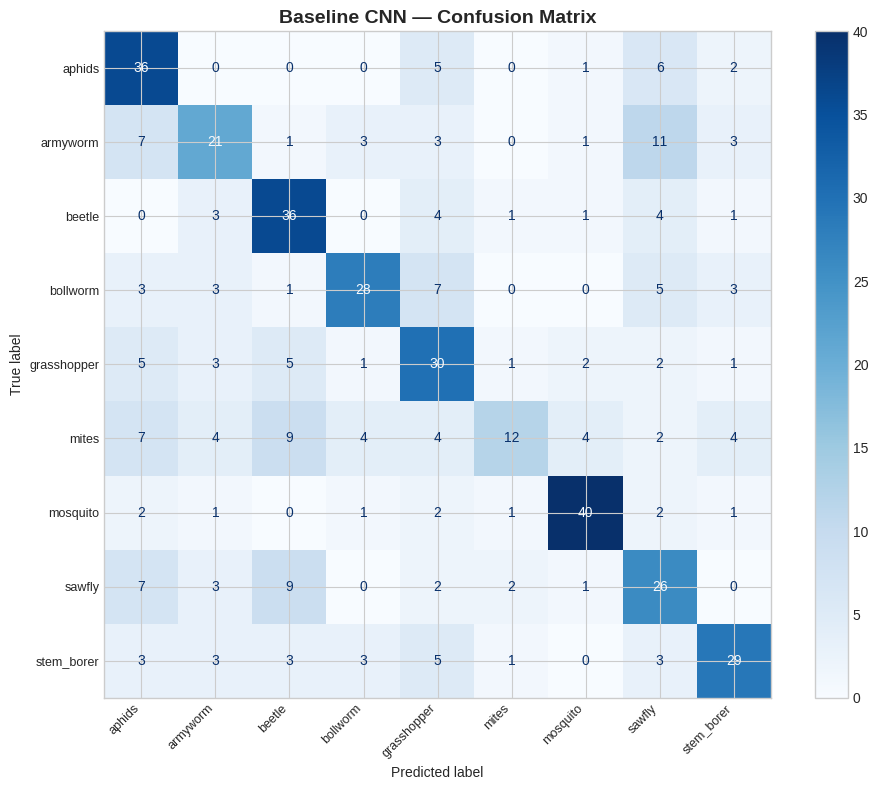

In [ ]:
# Evaluate baseline model
b_loss, b_acc, b_true, b_pred = evaluate_model(baseline_model, test_generator, CLASS_NAMES, model_name='Baseline CNN')

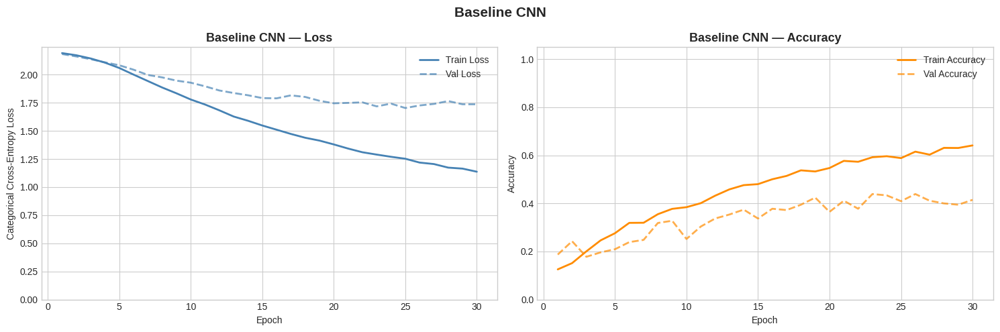

In [ ]:
plot_training_curves(baseline_history, title='Baseline CNN')

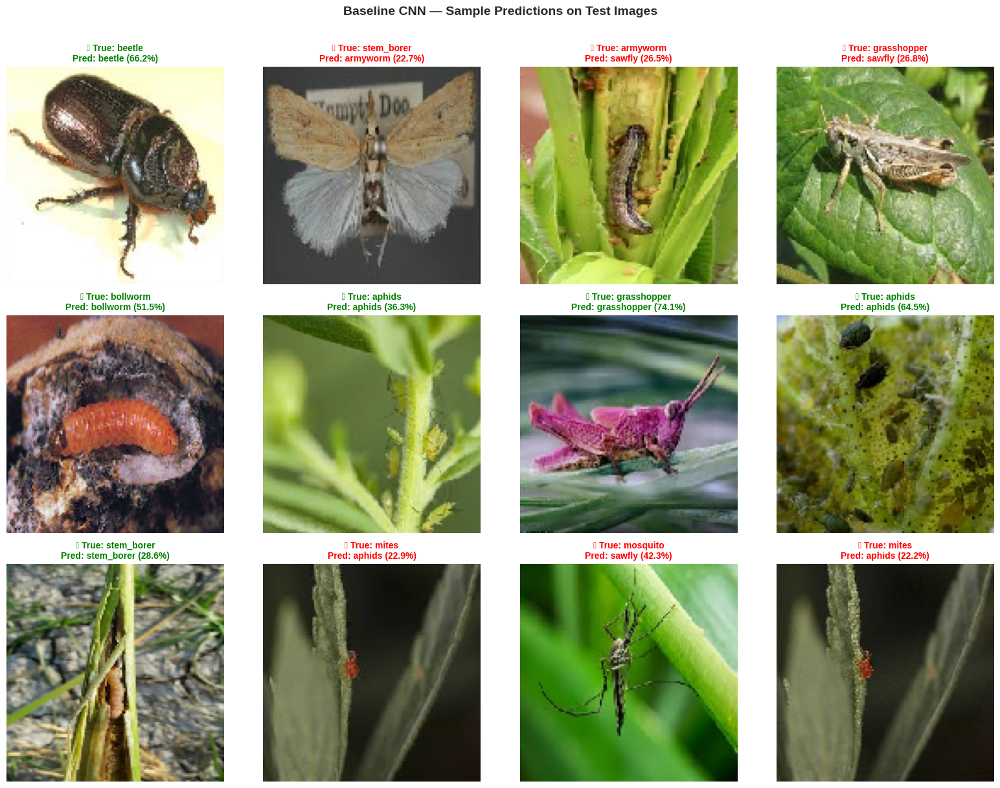

In [ ]:
predict_and_visualization(baseline_model, TEST_DIR, CLASS_NAMES, model_name='Baseline CNN')

---
## Task 3 – Deeper CNN Architecture with Regularisation
---

In [ ]:
# Build Deeper CNN with Regularisation
def build_deeper_model(input_shape=(128, 128, 3), num_classes=9):

    model = models.Sequential(name='Deeper_CNN_with_Regularization')
    model.add(layers.Input(shape=input_shape))

    # Block 1: 32 filters
    model.add(layers.Conv2D(32, (3,3), padding='same', name='conv1_1'))
    model.add(layers.BatchNormalization(name='bn1_1'))  # Normalize activations
    model.add(layers.Activation('relu'))

    model.add(layers.Conv2D(32, (3,3), padding='same', name='conv1_2'))
    model.add(layers.BatchNormalization(name='bn1_2'))
    model.add(layers.Activation('relu'))

    model.add(layers.MaxPooling2D((2,2), name='pool1'))  # 150 → 75
    model.add(layers.Dropout(0.2, name='drop1'))

    # Block 2: 64 filters
    model.add(layers.Conv2D(64, (3,3), padding='same',name='conv2_1'))
    model.add(layers.BatchNormalization(name='bn2_1'))
    model.add(layers.Activation('relu'))

    model.add(layers.Conv2D(64, (3,3), padding='same', name='conv2_2'))
    model.add(layers.BatchNormalization(name='bn2_2'))
    model.add(layers.Activation('relu'))

    model.add(layers.MaxPooling2D((2,2), name='pool2'))
    model.add(layers.Dropout(0.2, name='drop2'))

    # Block 3: 128 filters
    model.add(layers.Conv2D(128, (3,3), padding='same', name='conv3_1'))
    model.add(layers.BatchNormalization(name='bn3_1'))
    model.add(layers.Activation('relu'))

    model.add(layers.Conv2D(128, (3,3), padding='same', name='conv3_2'))
    model.add(layers.BatchNormalization(name='bn3_2'))
    model.add(layers.Activation('relu'))

    model.add(layers.MaxPooling2D((2,2), name='pool3'))
    model.add(layers.Dropout(0.2, name='drop3'))

    # Flatten + Dense Layers with Dropout
    model.add(layers.Flatten(name='flatten'))

    model.add(layers.Dense(512, name='fc1'))
    model.add(layers.BatchNormalization(name='bn_fc1'))
    model.add(layers.Activation('relu'))
    model.add(layers.Dropout(0.5, name='dropout1'))

    model.add(layers.Dense(256, name='fc2'))
    model.add(layers.BatchNormalization(name='bn_fc2'))
    model.add(layers.Activation('relu'))
    model.add(layers.Dropout(0.4, name='dropout2'))

    model.add(layers.Dense(128, name='fc3'))
    model.add(layers.Activation('relu'))
    model.add(layers.Dropout(0.3, name='dropout3'))

    # Output Layer
    model.add(layers.Dense(num_classes, activation='softmax', name='output'))

    return model


# Instantiate and compile with Adam
deeper_model = build_deeper_model(input_shape=(IMG_HEIGHT, IMG_WIDTH, 3),
                                num_classes=NUM_CLASSES)

In [ ]:
deeper_model.compile(
    optimizer = keras.optimizers.Adam(learning_rate=1e-4),
    loss      = 'categorical_crossentropy',
    metrics   = ['accuracy']
)

print("=" * 60)
print("DEEPER CNN MODEL SUMMARY")
print("=" * 60)
deeper_model.summary()

DEEPER CNN MODEL SUMMARY


Model: "Deeper_CNN_with_Regularization"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1_1 (Conv2D)                │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn1_1 (BatchNormalization)      │ (None, 128, 128, 32)   │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1_2 (Conv2D)                │ (None, 128, 128, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn1_2 (BatchNormalization)      │ (None, 128, 128, 32)   │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool1 (MaxPooling2D)            │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ drop1 (Dropout)                 │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2_1 (Conv2D)                │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn2_1 (BatchNormalization)      │ (None, 64, 64, 64)     │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2_2 (Conv2D)                │ (None, 64, 64, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn2_2 (BatchNormalization)      │ (None, 64, 64, 64)     │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2 (MaxPooling2D)            │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ drop2 (Dropout)                 │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3_1 (Conv2D)                │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn3_1 (BatchNormalization)      │ (None, 32, 32, 128)    │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_4 (Activation)       │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3_2 (Conv2D)                │ (None, 32, 32, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn3_2 (BatchNormalization)      │ (None, 32, 32, 128)    │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_5 (Activation)       │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool3 (MaxPooling2D)            │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ drop3 (Dropout)                 │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 32768)          │             

 Total params: 17,234,985 (65.75 MB)

 Trainable params: 17,232,553 (65.74 MB)

 Non-trainable params: 2,432 (9.50 KB)

In [ ]:
#Train the Deeper CNN Model

deeper_callbacks = [
    callbacks.EarlyStopping(
        monitor  = 'val_loss',
        patience = 8,
        restore_best_weights = True,
        verbose  = 1
    ),
    callbacks.ModelCheckpoint(
        filepath = 'best_deeper_model.keras',
        monitor  = 'val_accuracy',
        save_best_only = True,
        verbose  = 1
    )
]


In [ ]:
print("Training Deeper CNN... (this will take longer than baseline)")
start_time = time.time()

deeper_history = deeper_model.fit(
    train_generator,
    epochs          = 40,
    validation_data = val_generator,
    callbacks       = deeper_callbacks,
    verbose         = 1
)

deeper_train_time = time.time() - start_time
print(f"\nDeeper CNN training completed in {deeper_train_time:.1f} sec ({deeper_train_time/60:.1f} min)")

Training Deeper CNN... (this will take longer than baseline)
Epoch 1/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step - accuracy: 0.1161 - loss: 2.7692
Epoch 1: val_accuracy improved from None to 0.11111, saving model to best_deeper_model.keras

Epoch 1: finished saving model to best_deeper_model.keras
68/68 ━━━━━━━━━━━━━━━━━━━━ 56s 503ms/step - accuracy: 0.1426 - loss: 2.5935 - val_accuracy: 0.1111 - val_loss: 2.2580
Epoch 2/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step - accuracy: 0.2369 - loss: 2.2237
Epoch 2: val_accuracy improved from 0.11111 to 0.12593, saving model to best_deeper_model.keras

Epoch 2: finished saving model to best_deeper_model.keras
68/68 ━━━━━━━━━━━━━━━━━━━━ 19s 274ms/step - accuracy: 0.2338 - loss: 2.2039 - val_accuracy: 0.1259 - val_loss: 2.3945
Epoch 3/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step - accuracy: 0.2649 - loss: 2.0813
Epoch 3: val_accuracy did not improve from 0.12593
68/68 ━━━━━━━━━━━━━━━━━━━━ 18s 268ms/step - accuracy: 0.2731 - loss: 2.0466 - val_accur

In [ ]:
test_loss, test_acc = deeper_model.evaluate(test_generator)

print(f"\nFinal Test Accuracy: {test_acc:.4f}")

15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - accuracy: 0.7178 - loss: 0.9625

Final Test Accuracy: 0.7178



  Deeper CNN — Evaluation Results
  Test Loss     : 0.9625
  Test Accuracy : 71.78%

Classification Report:
              precision    recall  f1-score   support

      aphids       0.77      0.80      0.78        50
    armyworm       0.65      0.86      0.74        50
      beetle       0.94      0.68      0.79        50
    bollworm       0.83      0.50      0.62        50
 grasshopper       0.68      0.84      0.75        50
       mites       0.47      0.74      0.57        50
    mosquito       0.86      0.88      0.87        50
      sawfly       0.72      0.52      0.60        50
  stem_borer       0.84      0.64      0.73        50

    accuracy                           0.72       450
   macro avg       0.75      0.72      0.72       450
weighted avg       0.75      0.72      0.72       450



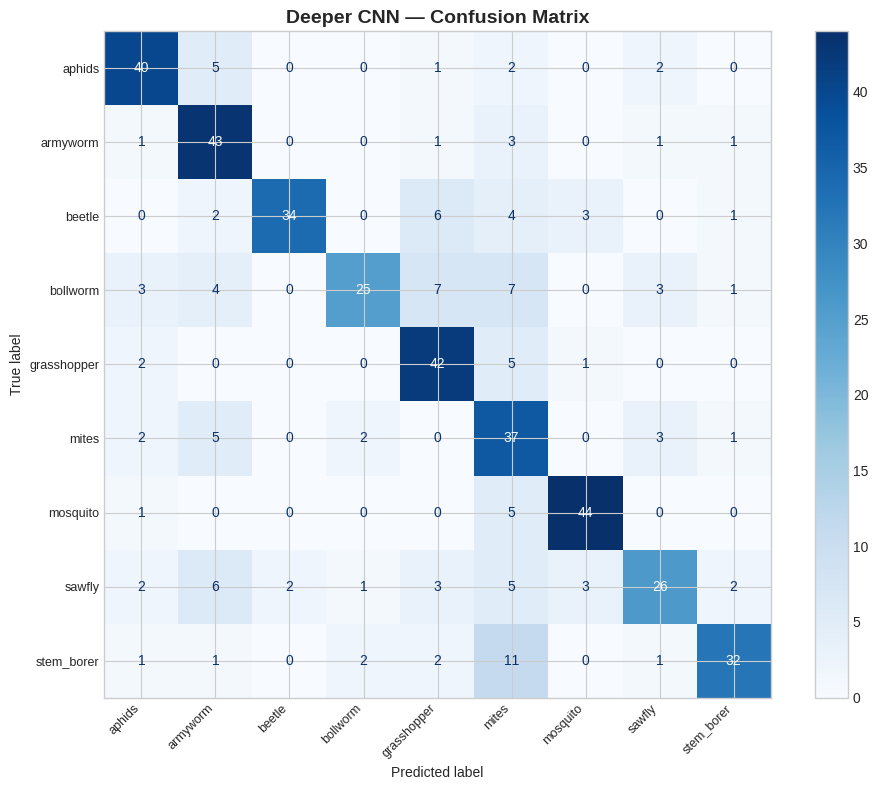

In [ ]:
d_loss, d_acc, d_true, d_pred = evaluate_model(
    deeper_model, test_generator, CLASS_NAMES, model_name='Deeper CNN'
)

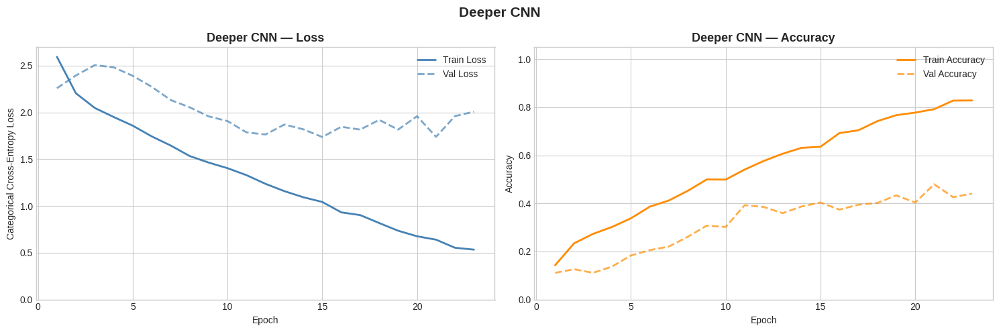

In [ ]:
plot_training_curves(deeper_history, title='Deeper CNN')

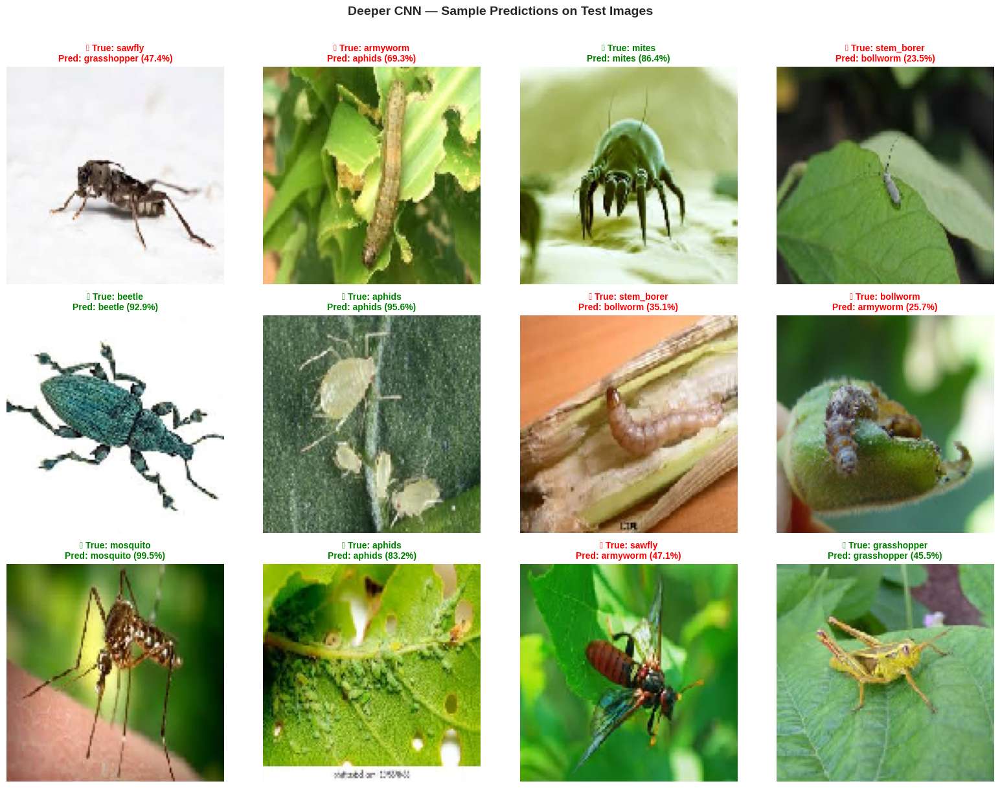

In [ ]:
predict_and_visualization(deeper_model, TEST_DIR, CLASS_NAMES, model_name='Deeper CNN')

---
## Task 4 – Experimentation and Comparative Analysis
---

In [ ]:
# Train Deeper CNN with SGD

deeper_model_sgd = build_deeper_model(input_shape=(IMG_HEIGHT, IMG_WIDTH, 3),
                                    num_classes=NUM_CLASSES)

# SGD with Nesterov momentum — a classic and effective configuration
sgd_optimizer = keras.optimizers.SGD(
    learning_rate = 1e-4,
    momentum      = 0.9,
    nesterov      = True    # Nesterov momentum looks ahead, improving convergence
)

deeper_model_sgd.compile(
    optimizer = sgd_optimizer,
    loss      = 'categorical_crossentropy',
    metrics   = ['accuracy']
)

sgd_callbacks = [
    callbacks.EarlyStopping(
        monitor  = 'val_loss',
        patience = 8,
        restore_best_weights = True,
        verbose  = 1
    ),
    callbacks.ModelCheckpoint(
        filepath = 'best_deeper_model_sdg.keras',
        monitor  = 'val_accuracy',
        save_best_only = True,
        verbose  = 1
    )
]


In [ ]:
print("Training Deeper CNN with SGD optimizer...")
start_time = time.time()

sgd_history = deeper_model_sgd.fit(
    train_generator,
    epochs          = 40,
    validation_data = val_generator,
    callbacks       = sgd_callbacks,
    verbose         = 1
)

sgd_train_time = time.time() - start_time
print(f"\nSGD training completed in {sgd_train_time:.1f} sec ({sgd_train_time/60:.1f} min)")

Training Deeper CNN with SGD optimizer...
Epoch 1/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step - accuracy: 0.1065 - loss: 2.7515
Epoch 1: val_accuracy improved from None to 0.11111, saving model to best_deeper_model_sdg.keras

Epoch 1: finished saving model to best_deeper_model_sdg.keras
68/68 ━━━━━━━━━━━━━━━━━━━━ 40s 427ms/step - accuracy: 0.1074 - loss: 2.7143 - val_accuracy: 0.1111 - val_loss: 2.2100
Epoch 2/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step - accuracy: 0.1135 - loss: 2.6532
Epoch 2: val_accuracy improved from 0.11111 to 0.11296, saving model to best_deeper_model_sdg.keras

Epoch 2: finished saving model to best_deeper_model_sdg.keras
68/68 ━━━━━━━━━━━━━━━━━━━━ 20s 288ms/step - accuracy: 0.1181 - loss: 2.6090 - val_accuracy: 0.1130 - val_loss: 2.2169
Epoch 3/40
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step - accuracy: 0.1239 - loss: 2.5524
Epoch 3: val_accuracy improved from 0.11296 to 0.13333, saving model to best_deeper_model_sdg.keras

Epoch 3: finished saving model to best_d

In [ ]:
test_loss, test_acc = deeper_model_sgd.evaluate(test_generator)

print(f"\nFinal Test Accuracy: {test_acc:.4f}")

15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - accuracy: 0.5378 - loss: 1.4395

Final Test Accuracy: 0.5378



  Deeper CNN (SGD) — Evaluation Results
  Test Loss     : 1.4395
  Test Accuracy : 53.78%

Classification Report:
              precision    recall  f1-score   support

      aphids       0.58      0.60      0.59        50
    armyworm       0.45      0.42      0.43        50
      beetle       0.73      0.66      0.69        50
    bollworm       0.64      0.50      0.56        50
 grasshopper       0.58      0.52      0.55        50
       mites       0.43      0.52      0.47        50
    mosquito       0.59      0.86      0.70        50
      sawfly       0.33      0.38      0.36        50
  stem_borer       0.61      0.38      0.47        50

    accuracy                           0.54       450
   macro avg       0.55      0.54      0.54       450
weighted avg       0.55      0.54      0.54       450



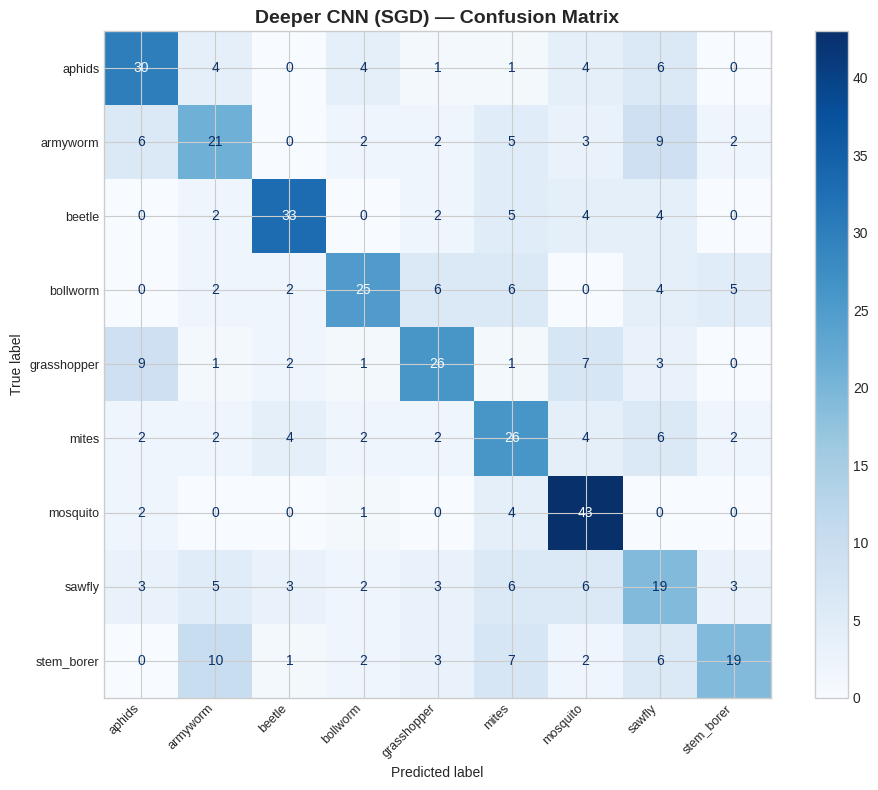

In [ ]:
# Evaluate
sgd_loss, sgd_acc, _, _ = evaluate_model(
    deeper_model_sgd, test_generator, CLASS_NAMES, model_name='Deeper CNN (SGD)'
)

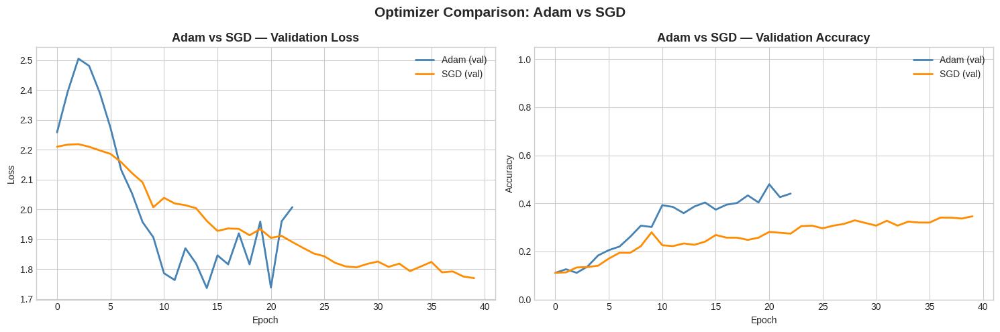

In [ ]:
# Optimizer Convergence Comparison Plot
# Compare how Adam vs SGD converge over training epochs.

fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Loss comparison
axes[0].plot(deeper_history.history['val_loss'], label='Adam (val)', color='steelblue', linewidth=2)
axes[0].plot(sgd_history.history['val_loss'],    label='SGD (val)',  color='darkorange', linewidth=2)
axes[0].set_title('Adam vs SGD — Validation Loss', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].legend()

# Accuracy comparison
axes[1].plot(deeper_history.history['val_accuracy'], label='Adam (val)', color='steelblue', linewidth=2)
axes[1].plot(sgd_history.history['val_accuracy'],    label='SGD (val)',  color='darkorange', linewidth=2)
axes[1].set_title('Adam vs SGD — Validation Accuracy', fontsize=13, fontweight='bold')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Accuracy')
axes[1].legend()
axes[1].set_ylim([0, 1.05])

plt.suptitle('Optimizer Comparison: Adam vs SGD', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.savefig('optimizer_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

In [ ]:
#  Ablation Study — Remove Dropout

def build_deeper_no_dropout(input_shape=(128, 128, 3), num_classes=9):

    model = models.Sequential(name='Deeper_CNN_No_Dropout')
    model.add(layers.Input(shape=input_shape))

    # Block 1: 32 filters
    model.add(layers.Conv2D(32, (3,3), padding='same', name='conv1_1'))
    model.add(layers.BatchNormalization(name='bn1_1'))  # Normalize activations
    model.add(layers.Activation('relu'))

    model.add(layers.Conv2D(32, (3,3), padding='same', name='conv1_2'))
    model.add(layers.BatchNormalization(name='bn1_2'))
    model.add(layers.Activation('relu'))

    model.add(layers.MaxPooling2D((2,2), name='pool1'))


    # Block 2: 64 filters
    model.add(layers.Conv2D(64, (3,3), padding='same',name='conv2_1'))
    model.add(layers.BatchNormalization(name='bn2_1'))
    model.add(layers.Activation('relu'))

    model.add(layers.Conv2D(64, (3,3), padding='same', name='conv2_2'))
    model.add(layers.BatchNormalization(name='bn2_2'))
    model.add(layers.Activation('relu'))

    model.add(layers.MaxPooling2D((2,2), name='pool2'))

    # Block 3: 128 filters
    model.add(layers.Conv2D(128, (3,3), padding='same', name='conv3_1'))
    model.add(layers.BatchNormalization(name='bn3_1'))
    model.add(layers.Activation('relu'))

    model.add(layers.Conv2D(128, (3,3), padding='same', name='conv3_2'))
    model.add(layers.BatchNormalization(name='bn3_2'))
    model.add(layers.Activation('relu'))

    model.add(layers.MaxPooling2D((2,2), name='pool3'))


    # Flatten + Dense Layers with Dropout
    model.add(layers.Flatten(name='flatten'))

    model.add(layers.Dense(512, name='fc1'))
    model.add(layers.BatchNormalization(name='bn_fc1'))
    model.add(layers.Activation('relu'))


    model.add(layers.Dense(256, name='fc2'))
    model.add(layers.Activation('relu'))


    model.add(layers.Dense(128, name='fc3'))
    model.add(layers.Activation('relu'))


    # Output Layer
    model.add(layers.Dense(num_classes, activation='softmax', name='output'))

    return model



no_dropout_model = build_deeper_no_dropout(
    input_shape=(IMG_HEIGHT, IMG_WIDTH, 3), num_classes=NUM_CLASSES
)


In [ ]:
no_dropout_model.compile(
    optimizer = keras.optimizers.Adam(learning_rate=1e-3),
    loss      = 'categorical_crossentropy',
    metrics   = ['accuracy']
)


In [ ]:
# Callbacks: EarlyStopping + ModelCheckpoint
no_dropout_callbacks = [
    callbacks.EarlyStopping(
        monitor='val_accuracy',
        patience=6,
        restore_best_weights=True,
        verbose=1
    ),

    callbacks.ModelCheckpoint(
        filepath='best_deeper_model_nodropout.keras',
        monitor='val_accuracy',
        save_best_only=True,
        verbose=0
    )
]

In [ ]:
print("Training Ablation Model (No Dropout)...")
no_dropout_history = no_dropout_model.fit(
    train_generator,
    epochs          = 15,
    validation_data = val_generator,
    callbacks       = no_dropout_callbacks,
    verbose         = 1
)

Training Ablation Model (No Dropout)...
Epoch 1/15
68/68 ━━━━━━━━━━━━━━━━━━━━ 33s 330ms/step - accuracy: 0.4093 - loss: 1.7035 - val_accuracy: 0.1241 - val_loss: 2.4816
Epoch 2/15
68/68 ━━━━━━━━━━━━━━━━━━━━ 18s 271ms/step - accuracy: 0.6921 - loss: 0.9225 - val_accuracy: 0.1037 - val_loss: 2.9384
Epoch 3/15
68/68 ━━━━━━━━━━━━━━━━━━━━ 16s 235ms/step - accuracy: 0.8148 - loss: 0.5590 - val_accuracy: 0.0630 - val_loss: 3.1898
Epoch 4/15
68/68 ━━━━━━━━━━━━━━━━━━━━ 17s 249ms/step - accuracy: 0.8949 - loss: 0.3295 - val_accuracy: 0.1981 - val_loss: 3.9029
Epoch 5/15
68/68 ━━━━━━━━━━━━━━━━━━━━ 17s 253ms/step - accuracy: 0.9407 - loss: 0.1922 - val_accuracy: 0.2130 - val_loss: 3.3531
Epoch 6/15
68/68 ━━━━━━━━━━━━━━━━━━━━ 17s 256ms/step - accuracy: 0.9551 - loss: 0.1374 - val_accuracy: 0.3944 - val_loss: 3.2449
Epoch 7/15
68/68 ━━━━━━━━━━━━━━━━━━━━ 18s 259ms/step - accuracy: 0.9634 - loss: 0.1205 - val_accuracy: 0.3815 - val_loss: 3.2479
Epoch 8/15
68/68 ━━━━━━━━━━━━━━━━━━━━ 17s 255ms/step - ac


  Deeper CNN No Dropout — Evaluation Results
  Test Loss     : 0.8476
  Test Accuracy : 85.56%

Classification Report:
              precision    recall  f1-score   support

      aphids       0.96      0.90      0.93        50
    armyworm       0.86      0.84      0.85        50
      beetle       0.78      0.94      0.85        50
    bollworm       0.87      0.96      0.91        50
 grasshopper       0.98      0.88      0.93        50
       mites       0.77      0.60      0.67        50
    mosquito       0.94      0.92      0.93        50
      sawfly       0.73      0.76      0.75        50
  stem_borer       0.83      0.90      0.87        50

    accuracy                           0.86       450
   macro avg       0.86      0.86      0.85       450
weighted avg       0.86      0.86      0.85       450



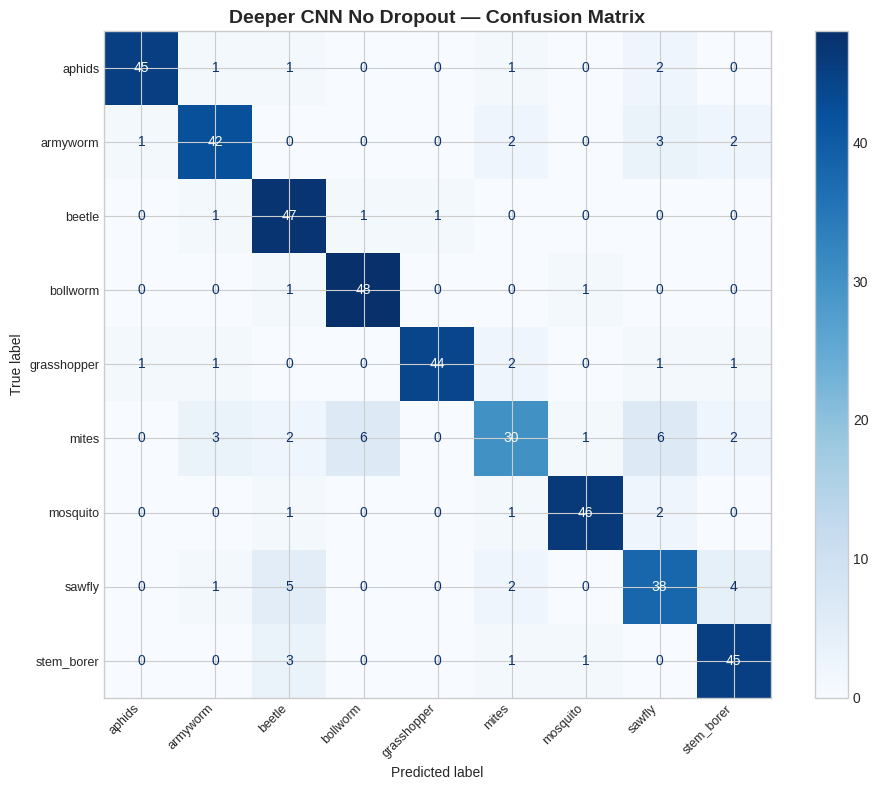

In [ ]:
abl_loss, abl_acc, _, _ = evaluate_model(
    no_dropout_model, test_generator, CLASS_NAMES, model_name='Deeper CNN No Dropout'
)

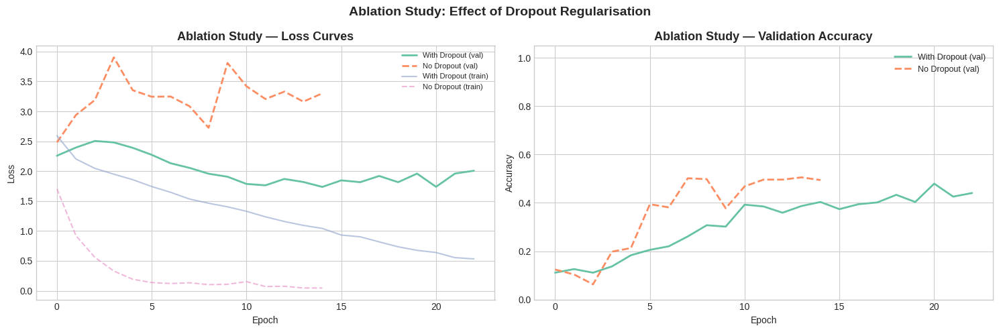

In [ ]:
# Ablation Study — Visual Comparison

fig, axes = plt.subplots(1, 2, figsize=(15, 5))

axes[0].plot(deeper_history.history['val_loss'],     label='With Dropout (val)', linewidth=2)
axes[0].plot(no_dropout_history.history['val_loss'],   label='No Dropout (val)',   linewidth=2, linestyle='--')
axes[0].plot(deeper_history.history['loss'],         label='With Dropout (train)', linewidth=1.5, alpha=0.6)
axes[0].plot(no_dropout_history.history['loss'],       label='No Dropout (train)',   linewidth=1.5, alpha=0.6, linestyle='--')
axes[0].set_title('Ablation Study — Loss Curves', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].legend(fontsize=8)

axes[1].plot(deeper_history.history['val_accuracy'],   label='With Dropout (val)', linewidth=2)
axes[1].plot(no_dropout_history.history['val_accuracy'], label='No Dropout (val)',   linewidth=2, linestyle='--')
axes[1].set_title('Ablation Study — Validation Accuracy', fontsize=13, fontweight='bold')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Accuracy')
axes[1].legend(fontsize=9)
axes[1].set_ylim([0, 1.05])

plt.suptitle('Ablation Study: Effect of Dropout Regularisation', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('ablation_study.png', dpi=150, bbox_inches='tight')
plt.show()


                   COMPREHENSIVE MODEL COMPARISON SUMMARY
                  Model  Test Accuracy (%)  Test Loss Train Time (sec)    Optimizer    Regularisation
           Baseline CNN              57.33     1.3078            501.2         Adam           Dropout
      Deeper CNN (Adam)              71.78     0.9625            451.3         Adam BN + Dropout + L2
       Deeper CNN (SGD)              53.78     1.4395            734.4 SGD+Nesterov BN + Dropout + L2
Deeper CNN (No Dropout)              85.56     0.8476              N/A         Adam      BN + L2 only


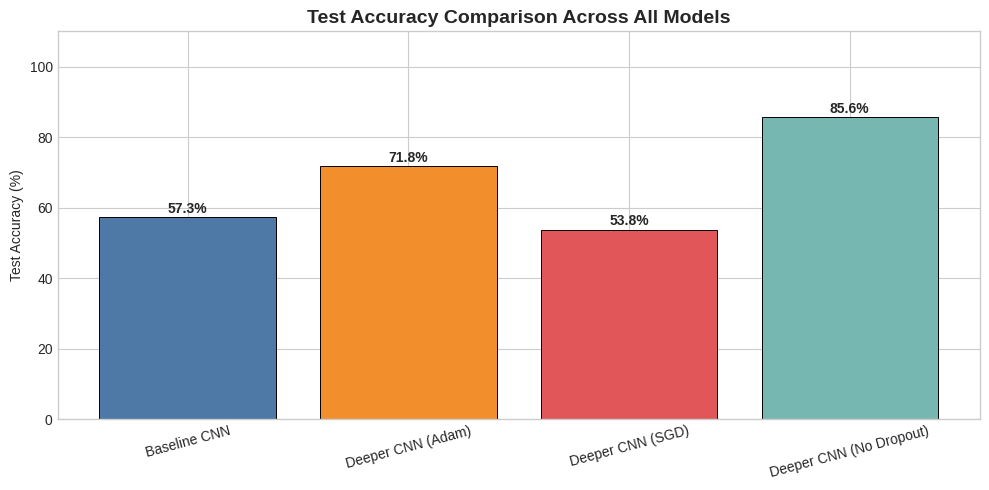

In [ ]:
# Comprehensive Model Comparison Table
# Summarise all experiments in a single table for the report.

comparison_data = {
    'Model'              : ['Baseline CNN', 'Deeper CNN (Adam)', 'Deeper CNN (SGD)', 'Deeper CNN (No Dropout)'],
    'Test Accuracy (%)'  : [round(b_acc * 100, 2),
                            round(d_acc * 100, 2),
                            round(sgd_acc * 100, 2),
                            round(abl_acc * 100, 2)],
    'Test Loss'          : [round(b_loss, 4), round(d_loss, 4), round(sgd_loss, 4), round(abl_loss, 4)],
    'Train Time (sec)'   : [round(baseline_train_time, 1), round(deeper_train_time, 1),
                            round(sgd_train_time, 1), 'N/A'],
    'Optimizer'          : ['Adam', 'Adam', 'SGD+Nesterov', 'Adam'],
    'Regularisation'     : ['Dropout', 'BN + Dropout + L2', 'BN + Dropout + L2', 'BN + L2 only']
}

comparison_df = pd.DataFrame(comparison_data)

print("\n" + "=" * 90)
print("                   COMPREHENSIVE MODEL COMPARISON SUMMARY")
print("=" * 90)
print(comparison_df.to_string(index=False))
print("=" * 90)

# Bar chart comparison of test accuracy
fig, ax = plt.subplots(figsize=(10, 5))
colors = ['#4e79a7', '#f28e2b', '#e15759', '#76b7b2']
bars = ax.bar(comparison_df['Model'], comparison_df['Test Accuracy (%)'],
              color=colors, edgecolor='black', linewidth=0.7)
for bar in bars:
    ax.text(bar.get_x() + bar.get_width()/2., bar.get_height() + 0.3,
            f'{bar.get_height():.1f}%', ha='center', va='bottom', fontsize=10, fontweight='bold')
ax.set_title('Test Accuracy Comparison Across All Models', fontsize=14, fontweight='bold')
ax.set_ylabel('Test Accuracy (%)')
ax.set_ylim([0, 110])
ax.tick_params(axis='x', rotation=15)
plt.tight_layout()
plt.savefig('model_accuracy_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

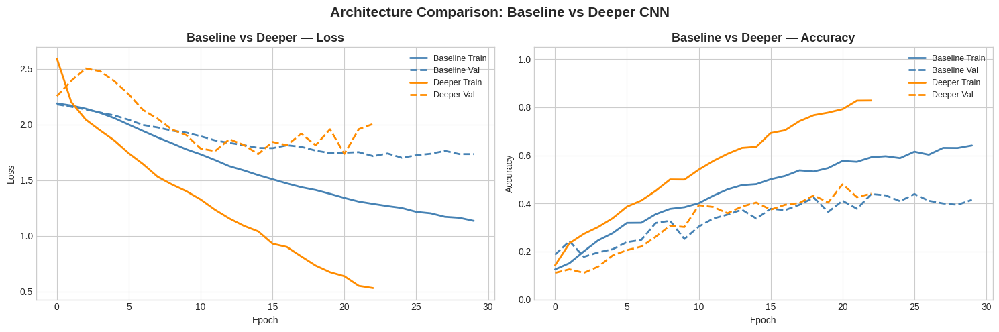

In [ ]:
# Baseline vs Deeper — Side-by-Side Loss Curve Overlay

fig, axes = plt.subplots(1, 2, figsize=(15, 5))

axes[0].plot(baseline_history.history['loss'],     label='Baseline Train', color='steelblue', linewidth=2)
axes[0].plot(baseline_history.history['val_loss'], label='Baseline Val',   color='steelblue',
             linewidth=2, linestyle='--')
axes[0].plot(deeper_history.history['loss'],       label='Deeper Train',   color='darkorange', linewidth=2)
axes[0].plot(deeper_history.history['val_loss'],   label='Deeper Val',     color='darkorange',
             linewidth=2, linestyle='--')
axes[0].set_title('Baseline vs Deeper — Loss', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].legend(fontsize=9)

axes[1].plot(baseline_history.history['accuracy'],     label='Baseline Train', color='steelblue', linewidth=2)
axes[1].plot(baseline_history.history['val_accuracy'], label='Baseline Val',   color='steelblue',
             linewidth=2, linestyle='--')
axes[1].plot(deeper_history.history['accuracy'],       label='Deeper Train',   color='darkorange', linewidth=2)
axes[1].plot(deeper_history.history['val_accuracy'],   label='Deeper Val',     color='darkorange',
             linewidth=2, linestyle='--')
axes[1].set_title('Baseline vs Deeper — Accuracy', fontsize=13, fontweight='bold')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Accuracy')
axes[1].legend(fontsize=9)
axes[1].set_ylim([0, 1.05])

plt.suptitle('Architecture Comparison: Baseline vs Deeper CNN', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.savefig('baseline_vs_deeper_curves.png', dpi=150, bbox_inches='tight')
plt.show()


## Part B: Fine-Tuning a Pre-Trained Model( EfficientNetB0)for Transfer Learning




In [ ]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.applications.efficientnet import preprocess_input

In [ ]:
# Data Generators for Transfer Learning

TL_IMG_HEIGHT = 224
TL_IMG_WIDTH  = 224
SEED =42

# Training generator with augmentation
tl_train_datagen = ImageDataGenerator(
    preprocessing_function = preprocess_input,
    validation_split       = 0.2,
    horizontal_flip        = True,
    rotation_range         = 15,
    zoom_range             = 0.1,
)
tl_val_datagen = ImageDataGenerator(
    preprocessing_function = preprocess_input
)
# Test generator
tl_test_datagen = ImageDataGenerator(
    preprocessing_function = preprocess_input
)

tl_train_generator = tl_train_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size = (TL_IMG_HEIGHT, TL_IMG_WIDTH),
    batch_size  = 32,
    class_mode  = 'categorical',
    subset      = 'training',
    shuffle     = True,
    seed        = SEED
)

tl_val_generator = tl_train_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size = (TL_IMG_HEIGHT, TL_IMG_WIDTH),
    batch_size  = 32,
    class_mode  = 'categorical',
    subset      = 'validation',
    shuffle     = False,
    seed        = SEED
)

tl_test_generator = tl_test_datagen.flow_from_directory(
    TEST_DIR,
    target_size = (TL_IMG_HEIGHT, TL_IMG_WIDTH),
    batch_size  = 32,
    class_mode  = 'categorical',
    shuffle     = False
)

print(f"Transfer Learning generators ready — input size: {TL_IMG_HEIGHT}×{TL_IMG_WIDTH}")

Found 2160 images belonging to 9 classes.
Found 540 images belonging to 9 classes.
Found 450 images belonging to 9 classes.
Transfer Learning generators ready — input size: 224×224


In [ ]:
# Load pretrained base
base_model = EfficientNetB0(
    weights     = 'imagenet',
    include_top = False,
    input_shape = (224, 224, 3)
)
base_model.trainable = False

print(f"EfficientNetB0 base — Total layers: {len(base_model.layers)}")
print(f"EfficientNetB0 base — Trainable params (after freeze): {base_model.count_params():,}")

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
EfficientNetB0 base — Total layers: 238
EfficientNetB0 base — Trainable params (after freeze): 4,049,571


In [ ]:
from tensorflow.keras.models import Model
# Build custom classification head
x= base_model.output
x= layers.GlobalAveragePooling2D()(x)
x= layers.BatchNormalization()(x)
x= layers.Dense(256, activation='relu')(x)
x= layers.Dropout(0.4)(x)
x= layers.Dense(128, activation='relu')(x)
x= layers.Dropout(0.3)(x)
output = layers.Dense(NUM_CLASSES, activation='softmax')(x)

tl_model = Model(inputs=base_model.input, outputs=output, name='EfficientNetB0_Transfer_Learning')

In [ ]:
tl_model.compile(
    optimizer = keras.optimizers.Adam(learning_rate=1e-3),
    loss      = 'categorical_crossentropy',
    metrics   = ['accuracy']
)

print("\n" + "=" * 60)
print("TRANSFER LEARNING MODEL SUMMARY (Feature Extraction Phase)")
print("=" * 60)
tl_model.summary()


TRANSFER LEARNING MODEL SUMMARY (Feature Extraction Phase)


Model: "EfficientNetB0_Transfer_Learning"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 224, 224,  │          0 │ input_layer[0][0] │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, 224, 224,  │          7 │ rescaling[0][0]   │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, 224, 224,  │          0 │ normalization[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 225, 225,  │          0 │ rescaling_1[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        864 │ stem_conv_pad[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 112, 112,  │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 112, 112,  │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 112, 112,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 32)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 32)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 8)   │        264 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 32)  │        288 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 112, 112,  │          0 │ block1a_activati… │
│ (Multiply)          │ 32)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │        512 │ block1a_se_excit

 Total params: 4,416,684 (16.85 MB)

 Trainable params: 364,553 (1.39 MB)

 Non-trainable params: 4,052,131 (15.46 MB)

In [ ]:
# Feature Extraction Training

tl_callbacks = [
    callbacks.EarlyStopping(
        monitor  = 'val_loss',
        patience = 3,
        restore_best_weights = True,
        verbose  = 1
    ),
    callbacks.ModelCheckpoint(
        filepath = 'best_tl_phase1.keras',
        monitor  = 'val_accuracy',
        save_best_only = True,
        verbose  = 1
    )
]


In [ ]:
print("Phase 1: Training custom head only (base model frozen)...")
start_time = time.time()

tl_history_phase1 = tl_model.fit(
    tl_train_generator,
    epochs          = 6,
    validation_data = tl_val_generator,
    callbacks       = tl_callbacks,
    verbose         = 1
)

tl_phase1_time = time.time() - start_time
print(f"\nPhase 1 completed in {tl_phase1_time:.1f} sec ({tl_phase1_time/60:.1f} min)")

Phase 1: Training custom head only (base model frozen)...
Epoch 1/6
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 750ms/step - accuracy: 0.4933 - loss: 1.5533
Epoch 1: val_accuracy improved from None to 0.77037, saving model to best_tl_phase1.keras

Epoch 1: finished saving model to best_tl_phase1.keras
68/68 ━━━━━━━━━━━━━━━━━━━━ 112s 1s/step - accuracy: 0.6574 - loss: 1.0286 - val_accuracy: 0.7704 - val_loss: 0.8596
Epoch 2/6
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step - accuracy: 0.8754 - loss: 0.3560
Epoch 2: val_accuracy improved from 0.77037 to 0.84074, saving model to best_tl_phase1.keras

Epoch 2: finished saving model to best_tl_phase1.keras
68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 514ms/step - accuracy: 0.8926 - loss: 0.3146 - val_accuracy: 0.8407 - val_loss: 0.5836
Epoch 3/6
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step - accuracy: 0.9260 - loss: 0.2212
Epoch 3: val_accuracy improved from 0.84074 to 0.85556, saving model to best_tl_phase1.keras

Epoch 3: finished saving model to best_tl_phase1.keras
68/68 ━━━

In [ ]:
test_loss, test_acc = tl_model.evaluate(tl_test_generator)

print(f"\nFinal Test Accuracy: {test_acc:.4f}")

15/15 ━━━━━━━━━━━━━━━━━━━━ 12s 854ms/step - accuracy: 0.9400 - loss: 0.1957

Final Test Accuracy: 0.9400



  EfficientNetB0 Transfer Learning — Evaluation Results
  Test Loss     : 0.1957
  Test Accuracy : 94.00%

Classification Report:
              precision    recall  f1-score   support

      aphids       0.92      0.98      0.95        50
    armyworm       0.87      0.96      0.91        50
      beetle       1.00      0.96      0.98        50
    bollworm       0.96      0.90      0.93        50
 grasshopper       1.00      1.00      1.00        50
       mites       0.96      0.88      0.92        50
    mosquito       0.96      0.98      0.97        50
      sawfly       0.94      0.88      0.91        50
  stem_borer       0.87      0.92      0.89        50

    accuracy                           0.94       450
   macro avg       0.94      0.94      0.94       450
weighted avg       0.94      0.94      0.94       450



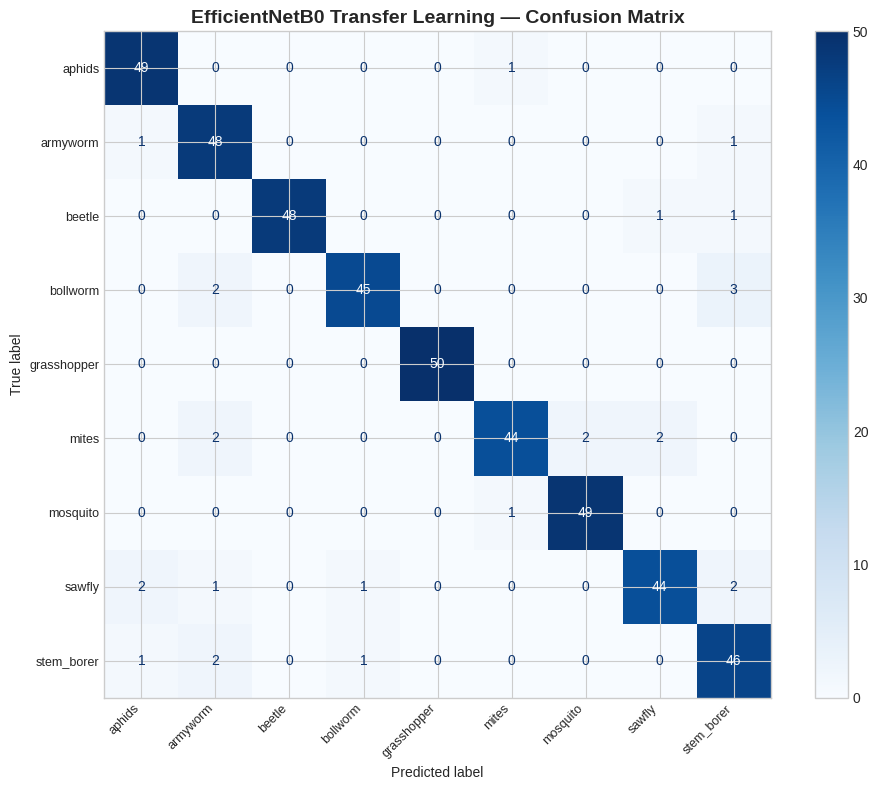

In [ ]:
tl_loss, tl_acc, tl_true, tl_pred = evaluate_model(
    tl_model, tl_test_generator, CLASS_NAMES, model_name='EfficientNetB0 Transfer Learning'
)

In [ ]:
# Fine-Tuning (Unfreeze Top Layers)

# Unfreeze the base model
base_model.trainable = True

# Freeze all except top 50 layers
for layer in base_model.layers[:-50]:
    layer.trainable = False

print(f"Total layers: {len(tl_model.layers)}")
print(f"Trainable layers: {len([l for l in tl_model.layers if l.trainable])}")
print(f"Frozen layers: {len([l for l in tl_model.layers if not l.trainable])}")



Total layers      : 245
Trainable layers  : 57
Frozen layers     : 188


In [ ]:
# Recompile with a LOWER learning rate
tl_model.compile(
    optimizer = keras.optimizers.Adam(learning_rate=1e-4),   # 10x lower than phase 1
    loss= 'categorical_crossentropy',
    metrics= ['accuracy']
)

In [ ]:
ft_callbacks = [
    callbacks.EarlyStopping(
        monitor  = 'val_loss',
        patience = 3,
        restore_best_weights = True,
        verbose  = 1
    ),
    callbacks.ModelCheckpoint(
        filepath = 'best_tl_finetuned.keras',
        monitor  = 'val_accuracy',
        save_best_only = True,
        verbose  = 1
    )
]

In [ ]:
print("\nPhase 2: Fine-tuning top layers of EfficientNetB0...")
start_time = time.time()

tl_history_phase2 = tl_model.fit(
    tl_train_generator,
    epochs          = 10,
    validation_data = tl_val_generator,
    callbacks       = ft_callbacks,
    verbose         = 1
)

tl_phase2_time = time.time() - start_time
print(f"\nPhase 2 completed in {tl_phase2_time:.1f} sec ({tl_phase2_time/60:.1f} min)")


Phase 2: Fine-tuning top layers of EfficientNetB0...
Epoch 1/10
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 679ms/step - accuracy: 0.8382 - loss: 0.4616
Epoch 1: val_accuracy improved from None to 0.82222, saving model to best_tl_finetuned.keras

Epoch 1: finished saving model to best_tl_finetuned.keras
68/68 ━━━━━━━━━━━━━━━━━━━━ 101s 995ms/step - accuracy: 0.8755 - loss: 0.3583 - val_accuracy: 0.8222 - val_loss: 0.5259
Epoch 2/10
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step - accuracy: 0.9445 - loss: 0.1742
Epoch 2: val_accuracy did not improve from 0.82222
68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 518ms/step - accuracy: 0.9463 - loss: 0.1721 - val_accuracy: 0.8167 - val_loss: 0.5827
Epoch 3/10
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step - accuracy: 0.9651 - loss: 0.1166
Epoch 3: val_accuracy improved from 0.82222 to 0.83148, saving model to best_tl_finetuned.keras

Epoch 3: finished saving model to best_tl_finetuned.keras
68/68 ━━━━━━━━━━━━━━━━━━━━ 37s 548ms/step - accuracy: 0.9676 - loss: 0.1088 - val_accuracy: 0

In [ ]:
test_loss, test_acc = tl_model.evaluate(tl_test_generator)

print(f"\nFinal Test Accuracy: {test_acc:.4f}")

15/15 ━━━━━━━━━━━━━━━━━━━━ 6s 391ms/step - accuracy: 0.9467 - loss: 0.2081

Final Test Accuracy: 0.9467



  EfficientNetB0 Transfer Learning — Evaluation Results
  Test Loss     : 0.2081
  Test Accuracy : 94.67%

Classification Report:
              precision    recall  f1-score   support

      aphids       0.96      0.94      0.95        50
    armyworm       0.88      1.00      0.93        50
      beetle       1.00      0.98      0.99        50
    bollworm       0.96      0.92      0.94        50
 grasshopper       0.98      1.00      0.99        50
       mites       0.96      0.88      0.92        50
    mosquito       0.92      0.98      0.95        50
      sawfly       0.93      0.86      0.90        50
  stem_borer       0.94      0.96      0.95        50

    accuracy                           0.95       450
   macro avg       0.95      0.95      0.95       450
weighted avg       0.95      0.95      0.95       450



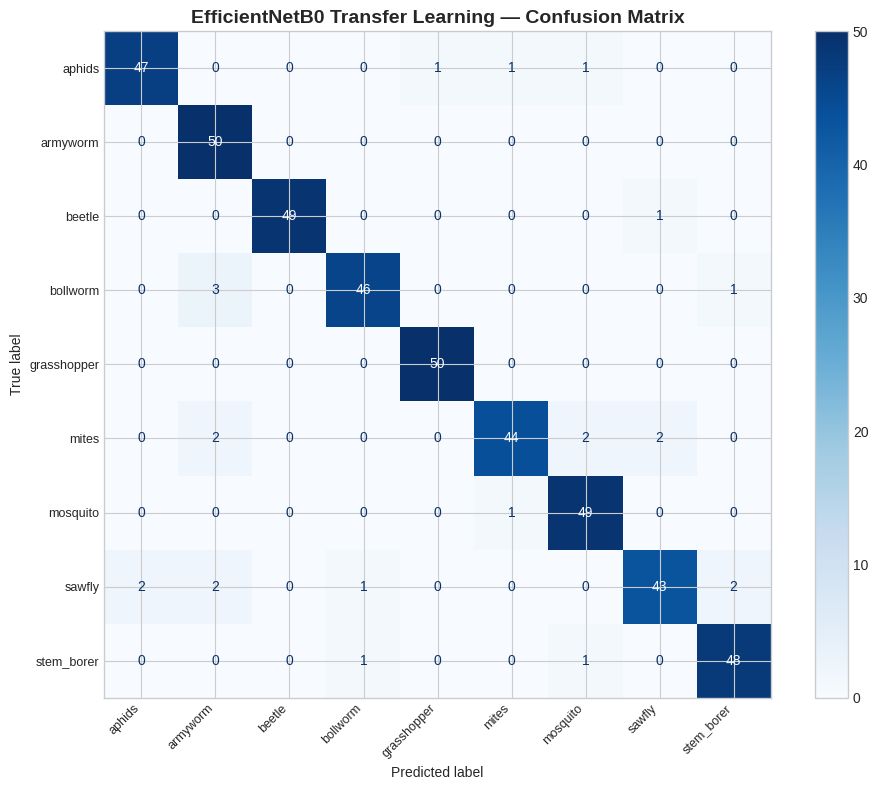

In [ ]:
tl_loss, tl_acc, tl_true, tl_pred = evaluate_model(
    tl_model, tl_test_generator, CLASS_NAMES, model_name='EfficientNetB0 Transfer Learning'
)

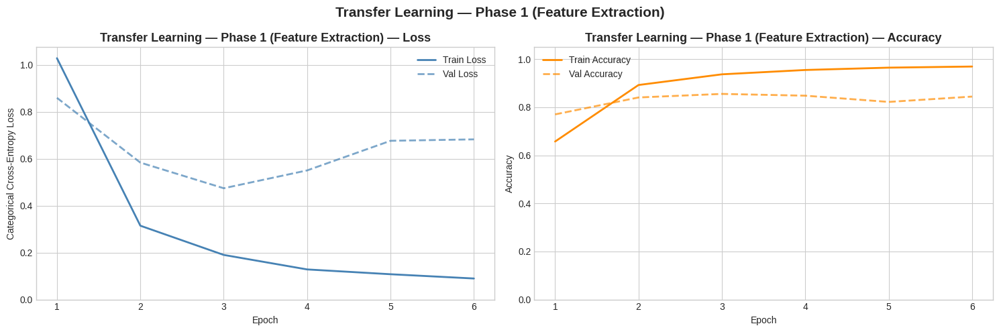

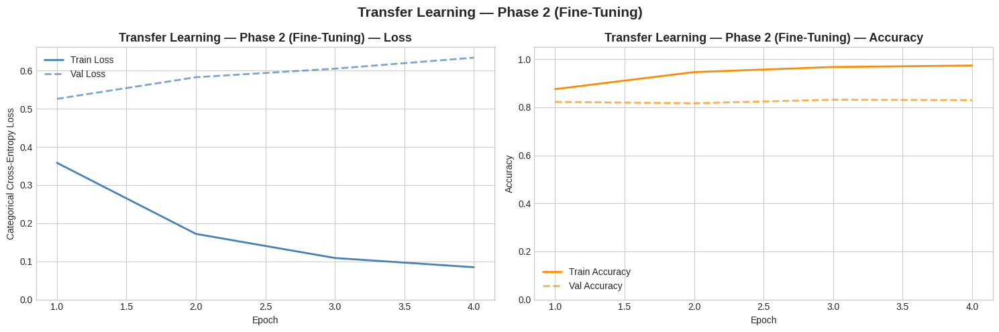

In [ ]:
# Evaluate Transfer Learning Model

plot_training_curves(tl_history_phase1, title='Transfer Learning — Phase 1 (Feature Extraction)')
plot_training_curves(tl_history_phase2, title='Transfer Learning — Phase 2 (Fine-Tuning)')



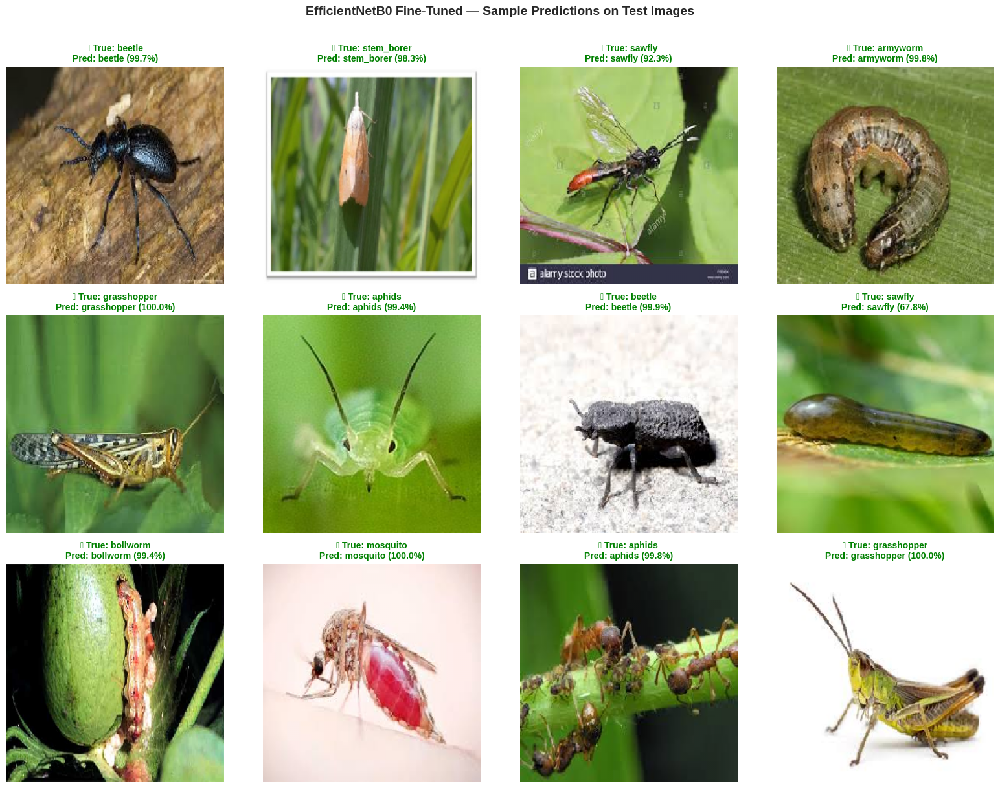

In [ ]:
# Sample predictions
IMG_SIZE_TL = (224, 224)
predict_and_visualization(
    tl_model, TEST_DIR, CLASS_NAMES,
    n_samples=12, img_size=IMG_SIZE_TL,
    model_name='EfficientNetB0 Fine-Tuned',
    normalize=False   # EfficientNet handles its own normalization internally
)